This is the python script ,created based on the novosparc tutorial, for reconstructing the 10X multiome data sptatially. 
The data input are count matrices generated with seurat. 

### Load libraries

In [3]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
"""
Created on Thu Feb 24 14:36:07 2022
@author: miriam
"""
import matplotlib
import novosparc
import os
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import altair as alt
from scipy.spatial.distance import cdist, squareform, pdist
from scipy.stats import ks_2samp
from scipy.stats import pearsonr
import random
random.seed(0)

path_out='output/15dec2022_all_genes/' # create the folder where the results should be stored
if not os.path.exists(path_out):
    os.makedirs(path_out)

#### load data

In [2]:
#os.getcwd()
# Reading expression data to scanpy AnnData (cells x genes)
data_dir = 'data/data_for_novosparc/rna/'
data_path = os.path.join(data_dir, 'rna_counts_scaled.tsv')
dataset = sc.read(data_path, delimiter=',').T
gene_names = dataset.var.index.tolist()


number of cells: 5094
number of genes: 11337


In [3]:
#preprocess 
sc.pp.normalize_per_cell(dataset)

In [4]:
num_cells, num_genes = dataset.shape 
print('number of cells: %d' % num_cells)
print('number of genes: %d' % num_genes)

number of cells: 5094
number of genes: 11337


In [5]:
# create target space
atlas_dir = 'data/BDTNP/'
target_space_path = os.path.join(atlas_dir, 'geometry.txt')
locations = pd.read_csv(target_space_path, sep=' ')
num_locations = 3039
locations_apriori = locations[:num_locations][['xcoord', 'zcoord']].values


In [6]:
 #marker genes: reading reference atlas
locations = locations_apriori
atlas_path = os.path.join(atlas_dir, 'BDTNP_dge_wFBGN.txt')
atlas = sc.read(atlas_path)
atlas_genes = atlas.var.index.tolist()
atlas.obsm['spatial'] = locations



In [7]:
#with how many markers

# construct Tissue object
tissue = novosparc.cm.Tissue(dataset=dataset, locations=locations)

# params for smooth cost
num_neighbors_s = num_neighbors_t = 5

# params for linear cost
markers = list(set(atlas_genes).intersection(gene_names))
#markers = ['FBgn0003448', 'FBgn0003720','FBgn0004102','FBgn0035956','FBgn0000606','FBgn0001180']#just use snail,etc
atlas_matrix = atlas.to_df()[markers].values
markers_idx = pd.DataFrame({'markers_idx': np.arange(num_genes)}, index=gene_names)
markers_to_use = np.concatenate(markers_idx.loc[markers].values)

# alternative 1: setup both assumptions 
tissue.setup_reconstruction(atlas_matrix=atlas_matrix, 
                            markers_to_use=markers_to_use, 
                            num_neighbors_s=num_neighbors_s, 
                            num_neighbors_t=num_neighbors_t)



Setting up for reconstruction ... done ( 55.96 seconds )


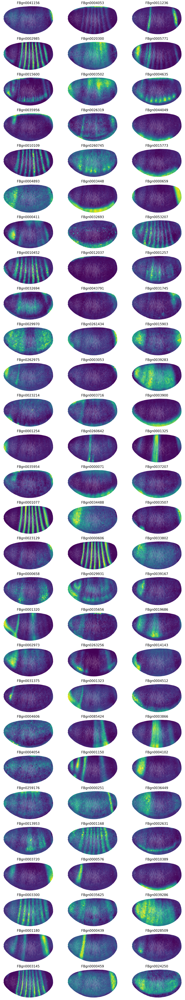

84

<Figure size 432x288 with 0 Axes>

In [8]:
#plot the marker genes used
pl_genes=markers
fig_markers=novosparc.pl.embedding(atlas, pl_genes)
len(markers)


In [9]:
# compute optimal transport of cells to locations
alpha_linear = 0.5
epsilon = 5e-3
tissue.reconstruct(alpha_linear=alpha_linear, epsilon=epsilon)

# configure locations probability values
rdist = novosparc.gm.prob_dist_from_center(locations)
atlas.obs['Alternative location marginals'] = rdist



Reconstructing spatial information with 84 markers: 5094 cells and 3039 locations ... 
Trying with epsilon: 5.00e-03


In [10]:
#plot all the available marker genes
#pl_genes=list(set(atlas_genes).intersection(gene_names))
#fig_markers=novosparc.pl.embedding(atlas, pl_genes)

/home/miriam/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:120: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


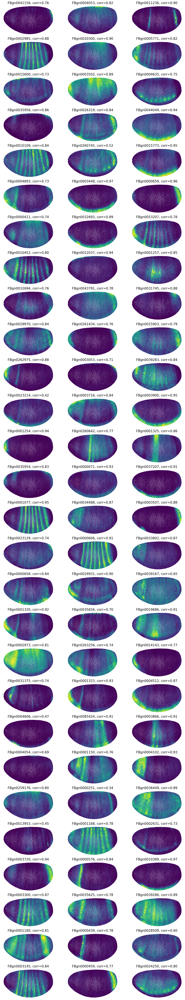

<Figure size 432x288 with 0 Axes>

In [11]:
# reconstructed expression of individual genes compared to marker genes
sdge = tissue.sdge
dataset_reconst = sc.AnnData(pd.DataFrame(sdge.T, columns=gene_names))
dataset_reconst.obsm['spatial'] = locations


all_markers = list(set(atlas_genes).intersection(gene_names))#the genes has to be in the atlas of markergenes
pl_genes=all_markers #which genes to use
title = ['%s, corr=%.02f' % (g, pearsonr(dataset_reconst[:,g].X.flatten(), atlas[:,g].X.flatten())[0] ) for g in pl_genes]
novosparc.pl.embedding(dataset_reconst, pl_genes, title=title)


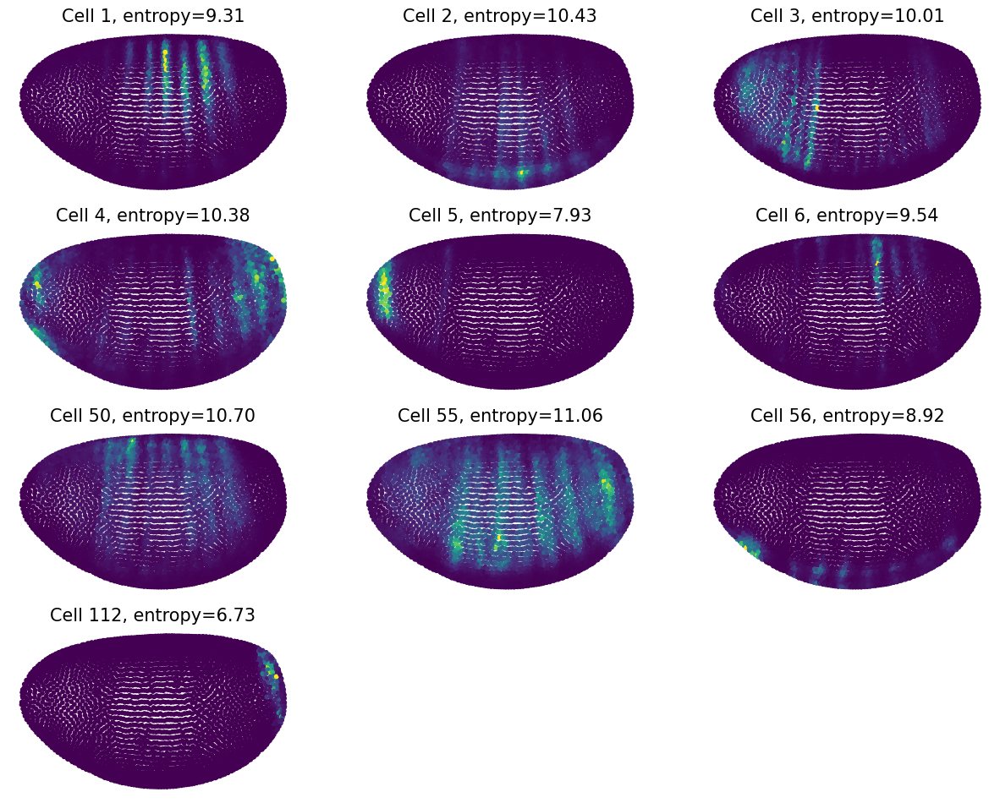

Reconstructing spatial information with 84 markers: 5094 cells and 3039 locations ... 
Trying with epsilon: 5.00e-03


<Figure size 432x288 with 0 Axes>

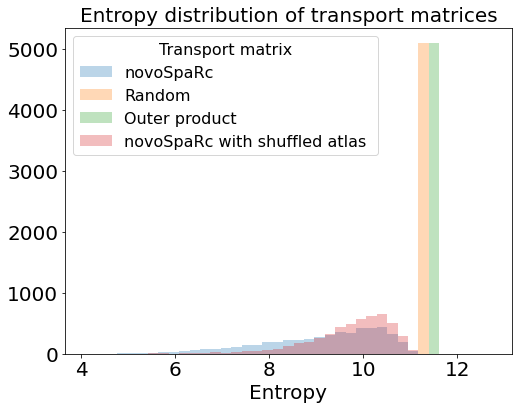

KstestResult(statistic=1.0, pvalue=0.0)
KstestResult(statistic=0.21692186886533177, pvalue=2.3961716685324932e-105)


In [12]:
#validate the localized mapping of individual cells (from the tutorial )
gw = tissue.gw
ngw = (gw.T / gw.sum(1)).T
cell_idx = [1,2,3,4,5,6, 50,55,56,112]
cell_prb_cols = ['cell %d' % i for i in cell_idx]
dataset_reconst.obs = pd.DataFrame(ngw.T[:, cell_idx], columns=cell_prb_cols)

title=['Cell %d, entropy=%.02f' % (i, novosparc.an.get_cell_entropy(ngw[i,:])) for i in cell_idx]
novosparc.pl.embedding(dataset_reconst, cell_prb_cols, title=title)

# comparing distributions of entropy for transporting a cell to locations
ent_T, ent_T_unif, ent_T_rproj, ent_T_shuf = novosparc.pl.plot_transport_entropy_dist(tissue)

print(ks_2samp(ent_T, ent_T_rproj))
print(ks_2samp(ent_T, ent_T_shuf))

In [13]:

#translate the FBgns to gene names
dicti_path = os.path.join(atlas_dir, 'FlyBase_Fields_download.txt') #load the dictionary for fly genes
dicti = pd.DataFrame(pd.read_csv(dicti_path,dtype='str',delimiter=',',usecols= (0,1),header=None))
d_idx = pd.DataFrame({'name': np.array(dicti[0]) , 'gene_idx': np.arange(dicti.shape[0])}, index=dicti[1])#dataframe with all genes to plot
#pl_gene_names = np.array(d_idx.loc[pl_genes]['name'])
print(d_idx.loc[pl_genes])

               name  gene_idx
1                            
FBgn0041156    exex        37
FBgn0004053     zen        81
FBgn0011236     ken        50
FBgn0002985     odd        65
FBgn0020300      gk        41
...             ...       ...
FBgn0000439     Dfd        26
FBgn0028509  CenG1A        12
FBgn0003145     prd        67
FBgn0000459   disco        27
FBgn0024250     brk         8

[84 rows x 2 columns]


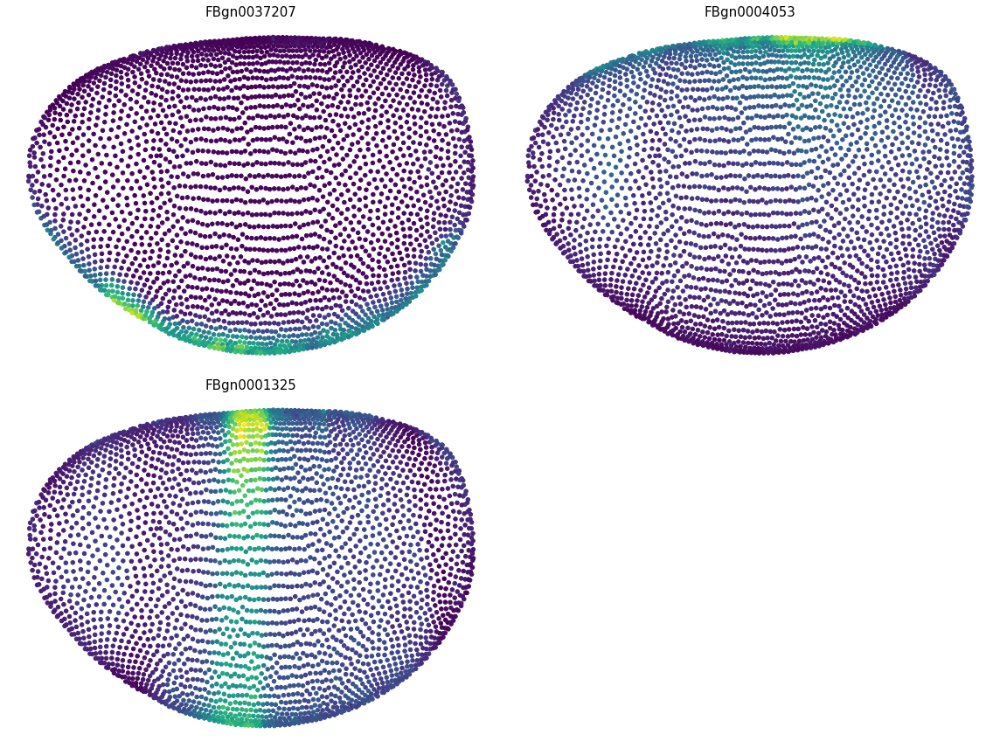

In [14]:
# reconstruction of individual genes
genes= ['FBgn0037207', 'FBgn0004053', 'FBgn0001325']

#adapted plot
size_x=16
size_y=12
pt_size=20
tit_size=15
cmap='viridis'
prefix=''
    
num_rows = int(round(np.sqrt(len(genes))))
plt.figure(figsize=(size_x, size_y))
    
idx = 1
for gene in genes:
    plt.subplot(num_rows, int(np.ceil(len(genes)/num_rows)), idx)
    gene_idx= gene_names.index(gene)
    plt.scatter(locations[:, 0], locations[:, 1], c=sdge[gene_idx, :],s=pt_size, cmap=cmap)
    plt.title(gene, size=tit_size)
    plt.axis('off')
    idx += 1
            
plt.tight_layout()
plt.show()

In [15]:
#get the probability values from cells to locations
dim_gw = pd.DataFrame(tissue.gw).shape # the probabilities of cells to locations
dim_sdge=pd.DataFrame(tissue.sdge).shape # calculated genes by locations

print('dimension of probability values : ', dim_gw)
print('dimension of virtual embryo : ', dim_sdge)

#load in  the ATAC data in scanpy AnnData (cells x genes)
data_dir_atac = 'data/data_for_novosparc/atac/'
data_path_atac = os.path.join(data_dir_atac, 'ATAC_counts_scaled.tsv')
dataset_atac = sc.read(data_path_atac, delimiter=',').T
peak_names = dataset_atac.var.index.tolist()

num_cells_atac, num_peaks_atac = dataset_atac.shape 

print('number of cells: %d' % num_cells_atac)
print('number of peaks: %d' % num_peaks_atac)



dimension of probability values :  (5094, 3039)
dimension of virtual embryo :  (11337, 3039)
number of cells: 5094
number of peaks: 19388


In [16]:
#calculate the spatial dca ( digital chromatin accessibility)
dca = dataset_atac.X
gw = pd.DataFrame(tissue.gw)

sdca = np.dot(dca.T, gw) #copied from novosparc.construct


In [17]:
# go save the files out
print ('Writing data to disk ...', end='', flush=True)

# spatial Gene Expression
np.savetxt(os.path.join(path_out+'/genes.txt'), gene_names, fmt='%s')
np.savetxt(os.path.join(path_out + '/sdge_' + str(num_cells) + '_cells_'
               + str(locations.shape[0]) + '_locations.txt'), sdge, fmt='%.4e')

#probability values
np.savetxt(os.path.join(path_out+'/cell_to_locations_gw.txt'),gw,fmt='%s')

# spatial Chromatin Accessibility
np.savetxt(os.path.join(path_out+'/peaks.txt'), peak_names, fmt='%s')
np.savetxt(os.path.join(path_out + '/sdca_' + str(num_cells_atac) + '_cells_'
               + str(locations.shape[0]) + '_locations.txt'), sdca, fmt='%.4e')


print ('done ')


Writing data to disk ...done 


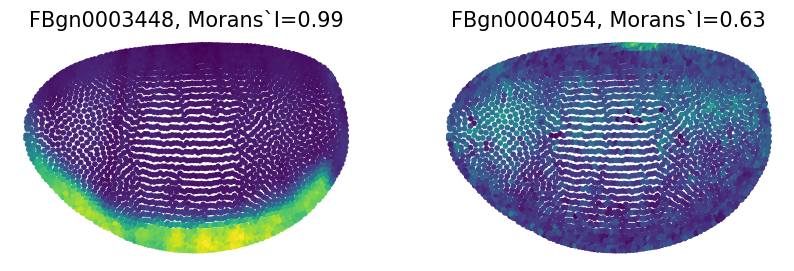

Mean MoransI: 0.88


<Figure size 432x288 with 0 Axes>

In [18]:
# They use it for testing the marker genes, whether they are spatial, but why not also for how spatial the CRMS are  
# one measure indicating how localized is the expression is Moran's I

mI, pvals = novosparc.an.get_moran_pvals(atlas.X, locations)
df = pd.DataFrame({'moransI': mI, 'pval': pvals}, index=atlas_genes)

gene_max_mI = df['moransI'].idxmax()
gene_min_mI = df['moransI'].idxmin()

title = ['%s, Morans`I=%.02f' % (gene_max_mI, df.loc[gene_max_mI]['moransI']), 
         '%s, Morans`I=%.02f' % (gene_min_mI, df.loc[gene_min_mI]['moransI'])]

novosparc.pl.embedding(atlas, [gene_max_mI, gene_min_mI], title=title)

print('Mean MoransI: %.02f' % df['moransI'].mean())

Morans I analysis for 184 genes...

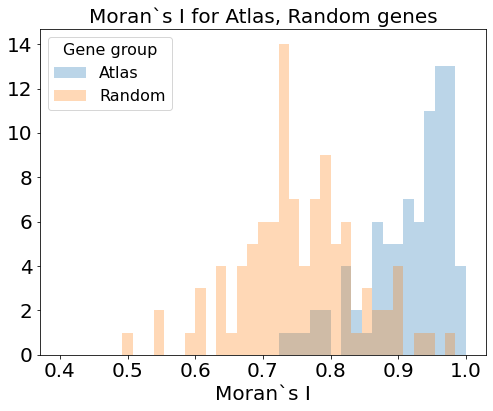

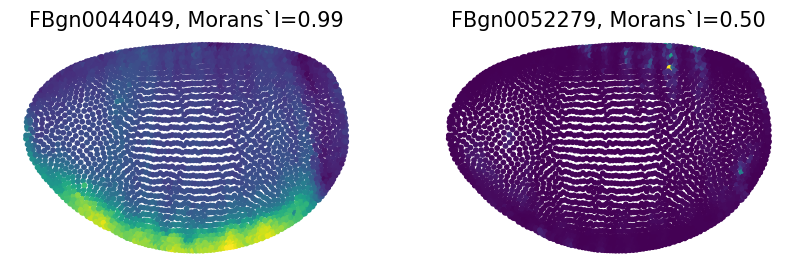

Mean Morans I for atlas genes: 0.92


<Figure size 432x288 with 0 Axes>

In [29]:
# Looking for spatially informative genes according to reconstruction in highly variable genes

atlas_genes = list(atlas.var_names)
random_genes = list(random.choices(gene_names,k=100))

mI_genes = atlas_genes + random_genes

tissue.calculate_spatially_informative_genes(mI_genes)
genes_with_scores = tissue.spatially_informative_genes

genes_with_scores.index = genes_with_scores['genes']

gene_groups = {'Atlas': atlas_genes, 'Random': random_genes}
novosparc.pl.plot_morans_dists(genes_with_scores, gene_groups)

gene_max_mI = genes_with_scores['genes'].iloc[0]
gene_min_mI = genes_with_scores['genes'].iloc[-1]

title = ['%s, Morans`I=%.02f' % (gene_max_mI, genes_with_scores.loc[gene_max_mI]['mI']), 
         '%s, Morans`I=%.02f' % (gene_min_mI, genes_with_scores.loc[gene_min_mI]['mI'])]

novosparc.pl.embedding(dataset_reconst, [gene_max_mI, gene_min_mI], title=title)

#print('Mean Morans I for cell-cycle genes: %.02f' % genes_with_scores.loc[cyc_genes]['mI'].mean())
print('Mean Morans I for atlas genes: %.02f' % genes_with_scores.loc[atlas_genes]['mI'].mean())